In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
from IPython.display import display
import numpy as np
import os
import torch
from PIL import Image, ImageDraw
from plotly.subplots import make_subplots

## Many perturbations results

In [14]:
folder_path = "/Users/ncohmpli/Documents/Professionnel/Technical/Verification/Lirpa for IoU/manip/pipeline/lirpa_iou_pipeline/results/many_exp_true"

In [15]:
csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]

In [16]:
dfs = []
for file in csv_files:
    file_path = os.path.join(folder_path, file)
    df = pd.read_csv(file_path, converters={'IoU_vanilla':pd.eval,'IoU_extension':pd.eval,'IoU_extension_greedy':pd.eval})
    dfs.append(df)
    combined_df = pd.concat(dfs, ignore_index=True)
combined_df = combined_df.sort_values(by="image_id")

In [17]:
combined_df["lb_box"] = combined_df["bounds_clip"].apply(lambda x: x[0])
combined_df["lb_box0"] = combined_df["bounds_clip"].apply(lambda x: x[0][0])
combined_df["ub_box"] = combined_df["bounds_clip"].apply(lambda x: x[1])
combined_df["IoU_vanilla_delta"] = combined_df.IoU_vanilla.apply(lambda x: x[1]-x[0])
combined_df["IoU_extension_delta"] = combined_df.IoU_extension.apply(lambda x: x[1]-x[0])

combined_df["Vanilla_upper"] = combined_df.IoU_vanilla.apply(lambda x: x[1])
combined_df["Vanilla_lower"] = combined_df.IoU_vanilla.apply(lambda x: x[0])
combined_df["Extension_upper"] = combined_df.IoU_extension.apply(lambda x: x[1])
combined_df["Extension_lower"] = combined_df.IoU_extension.apply(lambda x: x[0])

In [18]:
eps0 = combined_df[combined_df["eps"]==0]
bad_images_extension = np.unique(eps0[eps0["IoU_extension_delta"]>0.0001]["image_id"])
bad_images_vanilla = np.unique(eps0[eps0["IoU_vanilla_delta"]>0.0001]["image_id"])
def bad_images(im):
    if (im in bad_images_extension) or (im in bad_images_vanilla):
        return(True)
    return(False)


In [19]:
combined_df["bad_images"] = combined_df["image_id"].apply(lambda x: bad_images(x))

In [20]:
combined_df = combined_df[combined_df["bad_images"] == False]

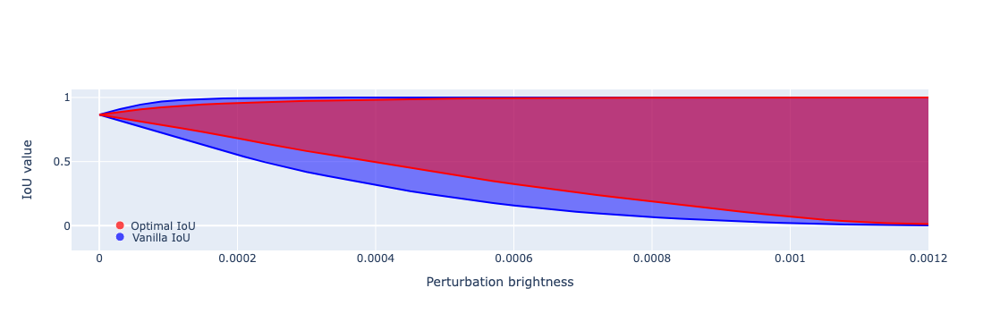

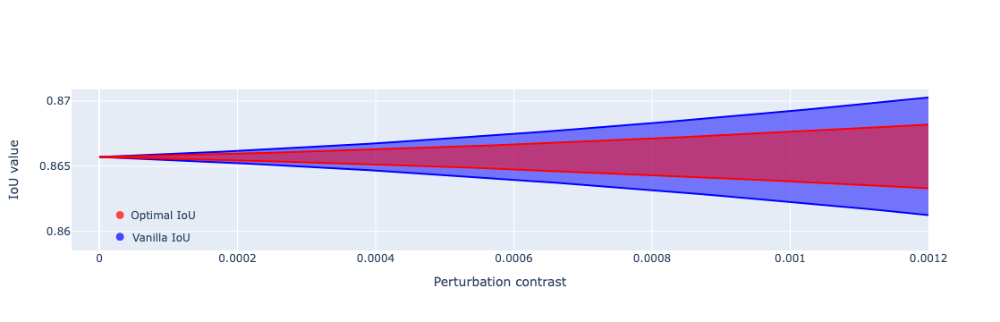

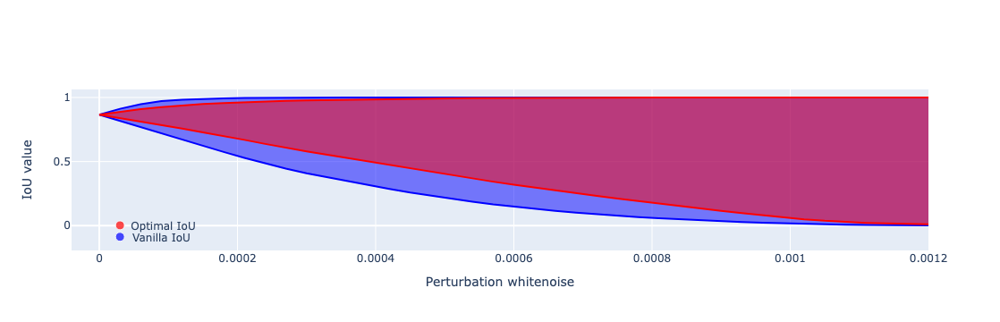

In [23]:
fig_pert_dict = {'brightness':[], 'contrast':[], 'whitenoise':[]}
for pert, list in fig_pert_dict.items():
    df_grouped = combined_df[(combined_df["perturbation"] == pert) & (combined_df["eps"] <= 0.0012)].groupby(["eps"] )[["Vanilla_upper", "Vanilla_lower", "Extension_upper", "Extension_lower"]].agg("mean")
    df_grouped = df_grouped.reset_index()
    fig = envelop_graph(df_grouped, eps="eps", title='', subtitle="", perturbation_xaxis=f'Perturbation {pert}' )
    fig.show()
    fig_pert_dict[pert].append(fig)

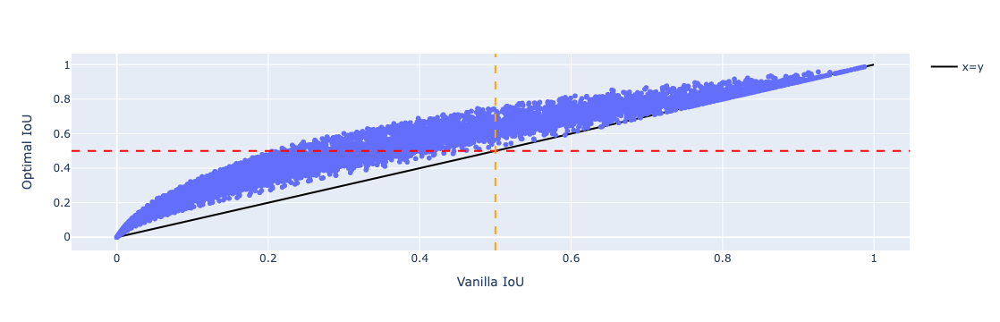

In [24]:

kk = combined_df[combined_df["perturbation"]=="whitenoise"].rename(columns={
    "Vanilla_lower":"Vanilla IoU",
    "Extension_lower":"Optimal IoU"})
fig = px.scatter(kk, x="Vanilla IoU", y="Optimal IoU")
fig.add_hline(y=0.5, line_dash="dash", line_color="red")
fig.add_vline(x=0.5, line_dash="dash", line_color="orange")
fig.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines', name='x=y', line_color="black"))
#fig.update_layout(title='Brightness perturbation' )
fig.show()


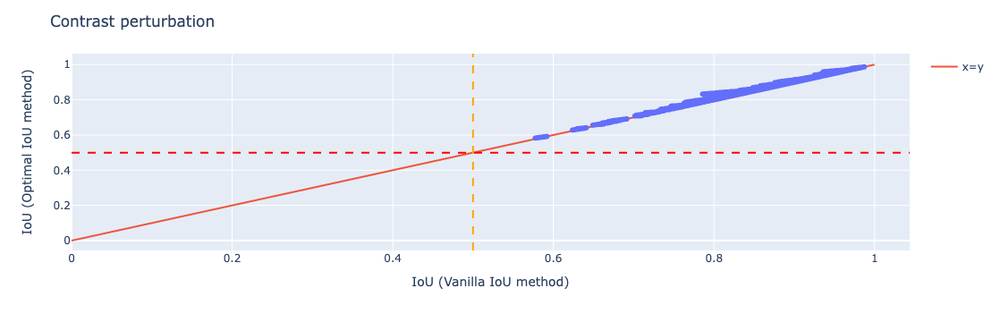

In [25]:
kk = combined_df[combined_df["perturbation"]=="contrast"].rename(columns={
    "Vanilla_lower":"IoU (Vanilla IoU method)",
    "Extension_lower":"IoU (Optimal IoU method)"})
fig = px.scatter(kk, x="IoU (Vanilla IoU method)", y="IoU (Optimal IoU method)")
fig.add_hline(y=0.5, line_dash="dash", line_color="red")
fig.add_vline(x=0.5, line_dash="dash", line_color="orange")
fig.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines', name='x=y'))
fig.update_layout(title='Contrast perturbation' )
fig.show()

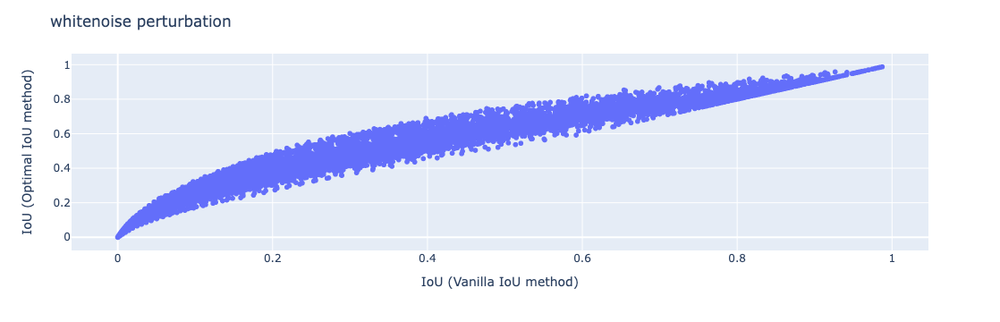

In [26]:
kk = combined_df[combined_df["perturbation"]=="whitenoise"].rename(columns={
    "Vanilla_lower":"IoU (Vanilla IoU method)",
    "Extension_lower":"IoU (Optimal IoU method)"})
fig.add_hline(y=0.5, line_dash="dash", line_color="red")
fig.add_vline(x=0.5, line_dash="dash", line_color="orange")
fig.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines', name='x=y'))
fig = px.scatter(kk, x="IoU (Vanilla IoU method)", y="IoU (Optimal IoU method)")
fig.update_layout(title='whitenoise perturbation' )
fig.show()

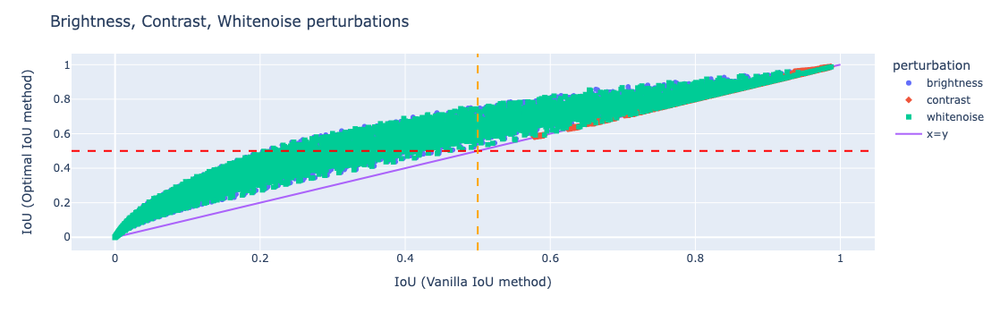

In [27]:
kk = combined_df.rename(columns={
    "Vanilla_lower":"IoU (Vanilla IoU method)",
    "Extension_lower":"IoU (Optimal IoU method)"})
fig = px.scatter(kk, x="IoU (Vanilla IoU method)", y="IoU (Optimal IoU method)", symbol="perturbation", color="perturbation")
fig.add_hline(y=0.5, line_dash="dash", line_color="red")
fig.add_vline(x=0.5, line_dash="dash", line_color="orange")
fig.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines', name='x=y'))
fig.update_layout(title='Brightness, Contrast, Whitenoise perturbations' )
fig.show()


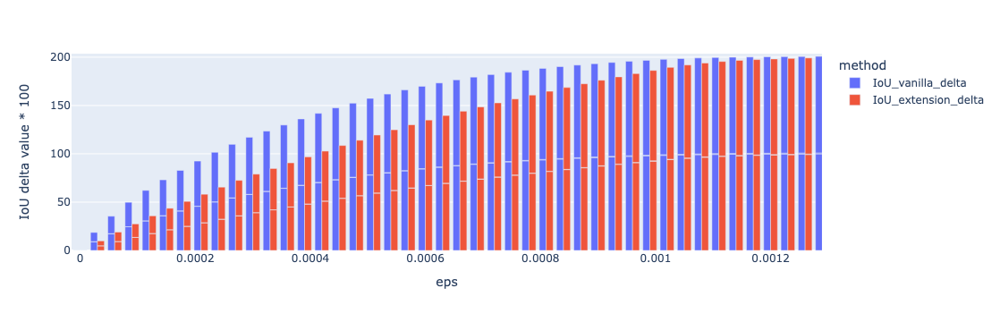

In [37]:
avg_precision = combined_df.groupby(["eps", "perturbation"])[["IoU_vanilla_delta",	"IoU_extension_delta"]].agg("mean")
avg_precision.reset_index().head(5)
avg_precision = combined_df.groupby(["eps", "perturbation"])[["IoU_vanilla_delta",	"IoU_extension_delta"]].agg("mean")
df_melted = avg_precision.reset_index().melt(id_vars='eps', value_vars=["IoU_vanilla_delta",	"IoU_extension_delta"], 
                                             var_name='method', 
                                             value_name='IoU delta value')
df_melted["IoU delta value * 100"] = df_melted["IoU delta value"].apply(lambda x: x*100)
px.bar(df_melted, x="eps", y="IoU delta value * 100", color="method", barmode="group")